### Imports

In [1]:
import sys
import cv2 as cv
import re
import tensorflow  as tf
import numpy as np
import matplotlib.pyplot as plt

from scripts import tf_text_graph_ssd, tf_text_graph_common

#### Get the model paths

In [2]:
model_file1 = "models/ssd_mobilenet_v2_coco_2018_03_29/frozen_inference_graph.pb"
pipeline_config1 = "models/ssd_mobilenet_v2_coco_2018_03_29/pipeline.config"

model_file2 = "models/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model/saved_model.pb"
pipeline_config2 = "models/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/pipeline.config"

In [3]:
# Output path
config_file1 = "models/ssd_mobilenet_v2_coco_2018_03_29/saved_model/ssd_mobilenet_v2_coco_2018_03_29.pbtxt"
config_file2 = "models/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.pbtxt"

# creat ssd graph
tf_text_graph_ssd.createSSDGraph(model_file1, pipeline_config1, config_file1)
tf_text_graph_ssd.createSSDGraph(model_file2, pipeline_config2, config_file2)

Scale: [0.200000-0.950000]
Aspect ratios: [1.0, 2.0, 0.5, 3.0, 0.333299994469]
Reduce boxes in the lowest layer: True
Number of classes: 90
Number of layers: 6
box predictor: convolutional
Input image size: 300x300
Levels: [3-7]
Anchor scale: 4.000000
Scales per octave: 2
Aspect ratios: [1.0, 2.0, 0.5]
Number of classes: 90
Number of layers: 5
box predictor: weight_shared_convolutional
Input image size: 640x640


[libprotobuf ERROR /Users/xperience/GHA-Actions-OpenCV/_work/opencv-python/opencv-python/opencv/3rdparty/protobuf/src/google/protobuf/wire_format_lite.cc:581] String field 'opencv_tensorflow.FunctionDef.Node.ret' contains invalid UTF-8 data when parsing a protocol buffer. Use the 'bytes' type if you intend to send raw bytes. 


ModuleNotFoundError: No module named 'tensorflow.tools.graph_transforms'

In [ ]:
# Get class labels
with open("models/ssd_mobilenet_v2_coco_2018_03_29/labels.txt", "r") as f:
    labels = f.read().split("\n")

#### Read the Tensorflow model

In [ ]:
net1 = cv.dnn.readNetFromTensorflow(model_file1, config_file1)
net2 = cv.dnn.readNetFromTensorflow(model_file2, config_file2)

In [ ]:
def detect_objects(net, im):
    dim = 300

    blob = cv.dnn.blobFromImage(im, size=(dim, dim), swapRB=True, crop=False)

    net.setInput(blob)

    objects = net.forward()

    return objects

In [ ]:
def display_text(im, text, x, y):
    # Get text size and baseline
    text_size = cv.getTextSize(text, cv.FONT_HERSHEY_SIMPLEX, 0.7, 1)
    dim = text_size[0]
    baseline = text_size[1]
    
    # Draw a filled rectangle for text background
    cv.rectangle(im, (x, y - dim[1] - baseline), (x + dim[0], y+baseline), (255, 255, 255), cv.FILLED)
    
    # Overlay the text on top
    cv.putText(im, text, (x, y - baseline), cv.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 1, cv.LINE_AA)

In [ ]:
def display_objects(im, objects, threshold=0.25):

    rows = im.shape[0]; cols = im.shape[1]

    for i in range(objects.shape[2]):

        class_id = int(objects[0, 0, i, 1])
        score = float(objects[0, 0, i, 2])

        # Retrieve original coordinates
        x = int(objects[0, 0, i, 3] * cols)
        y = int(objects[0, 0, i, 4] * rows)
        w = int(objects[0, 0, i, 5] * cols) - x
        h = int(objects[0, 0, i, 6] * rows) - y

        # Check if score is above threshold
        if score > threshold:

            # Display bounding box
            display_text(im, f"{labels[class_id-1]} {round(score,2)}", x, y)
            cv.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Convert image to RGB
    mp_img = cv.cvtColor(im, cv.COLOR_BGR2RGB)
    plt.figure(figsize=(30, 10)); plt.imshow(mp_img); plt.axis('off'), plt.show()

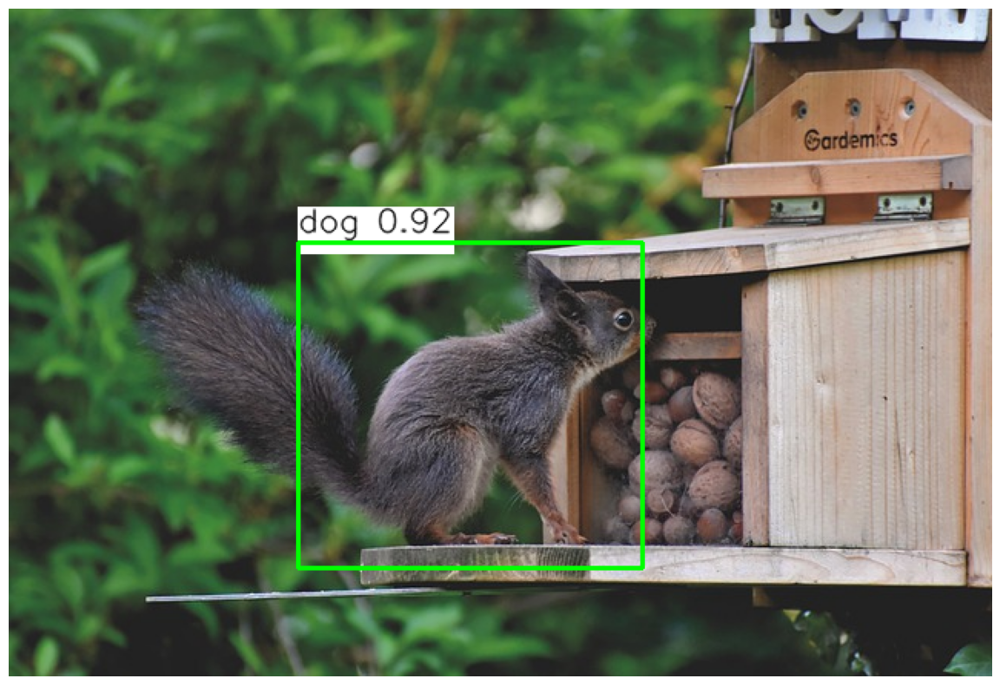

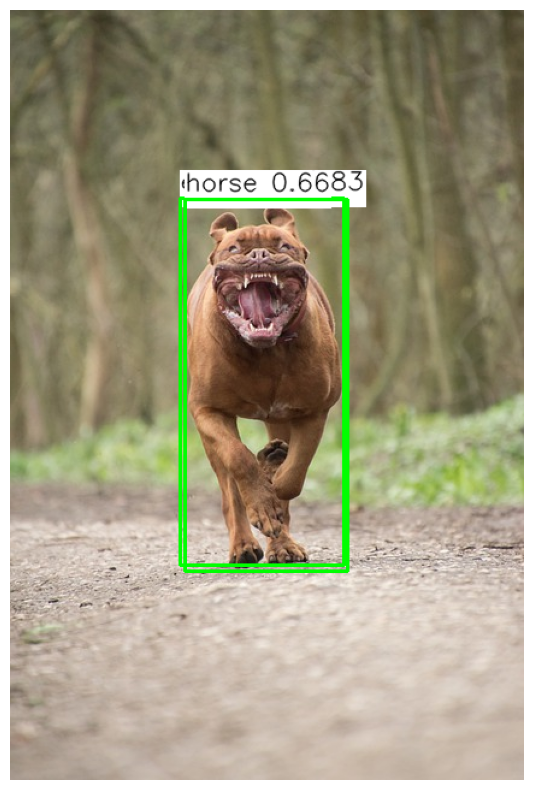

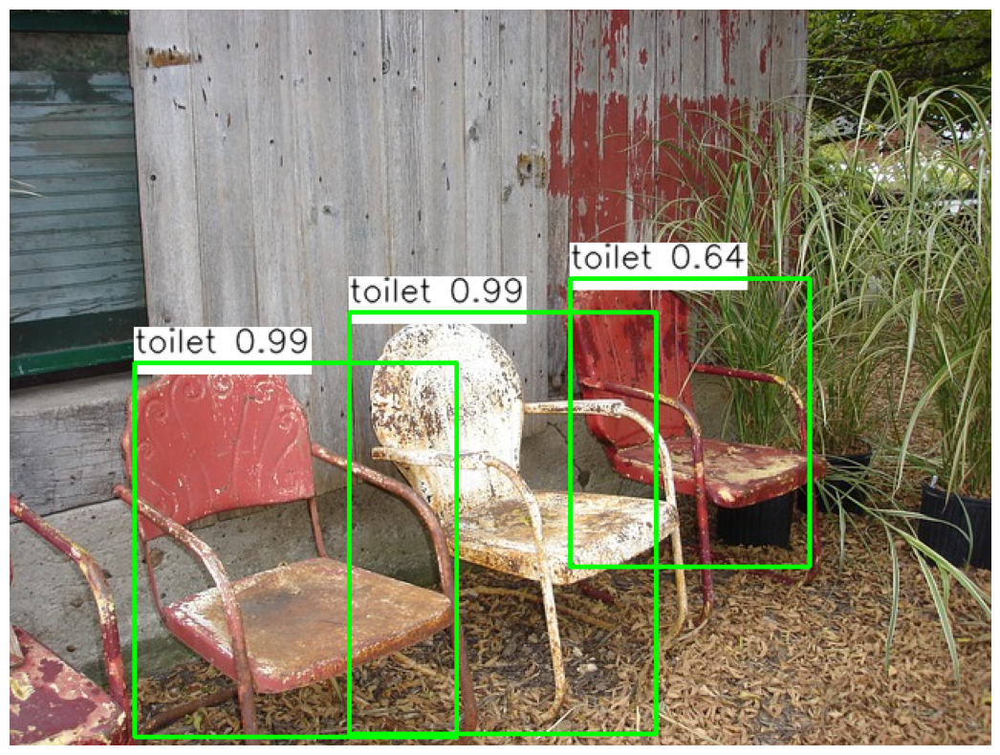

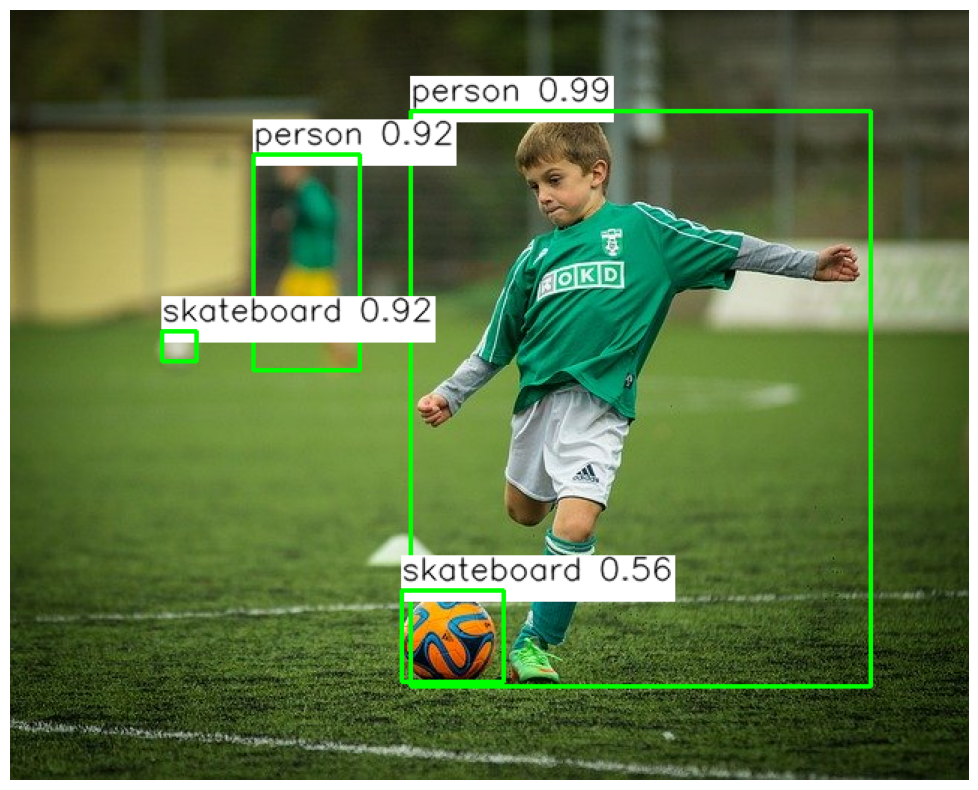

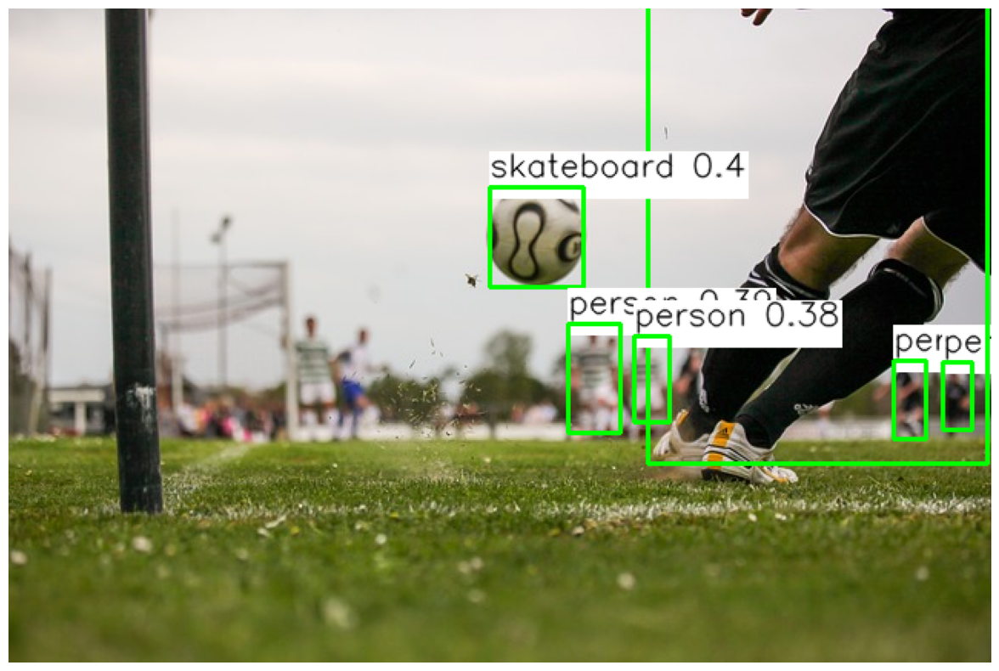

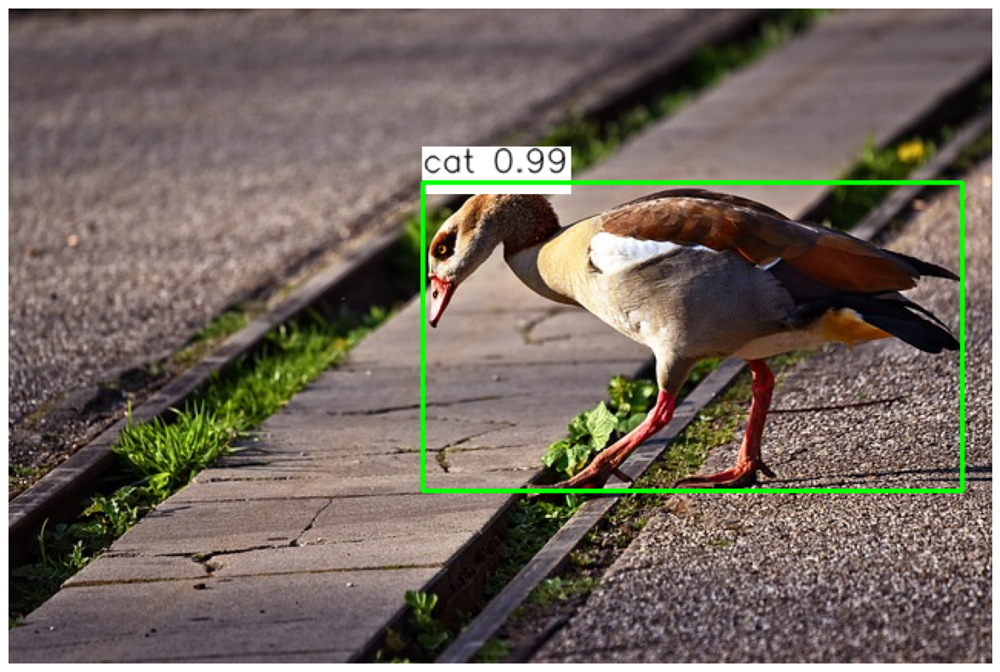

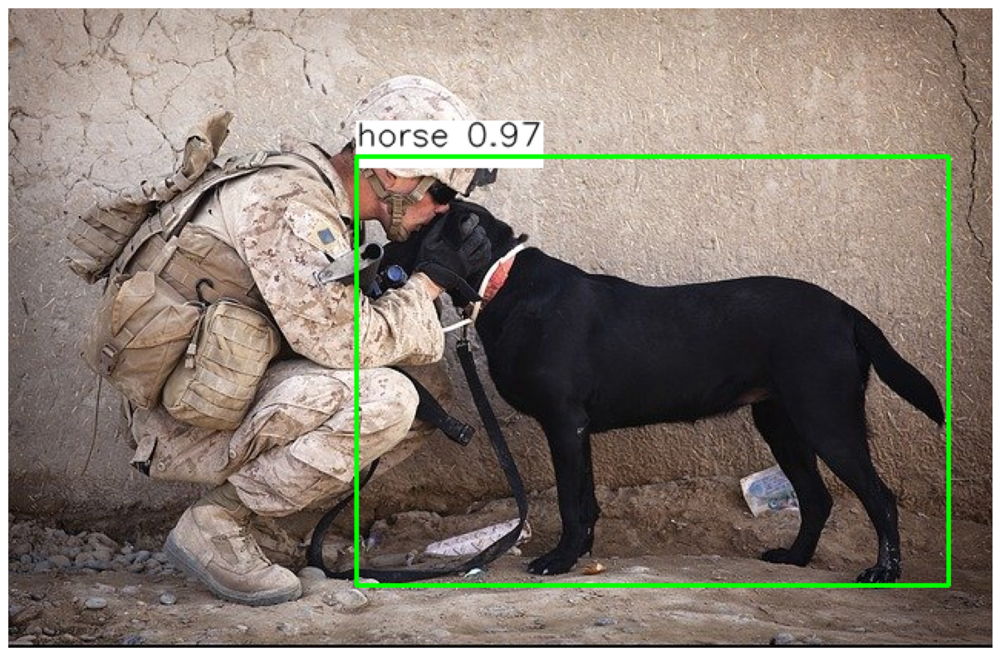

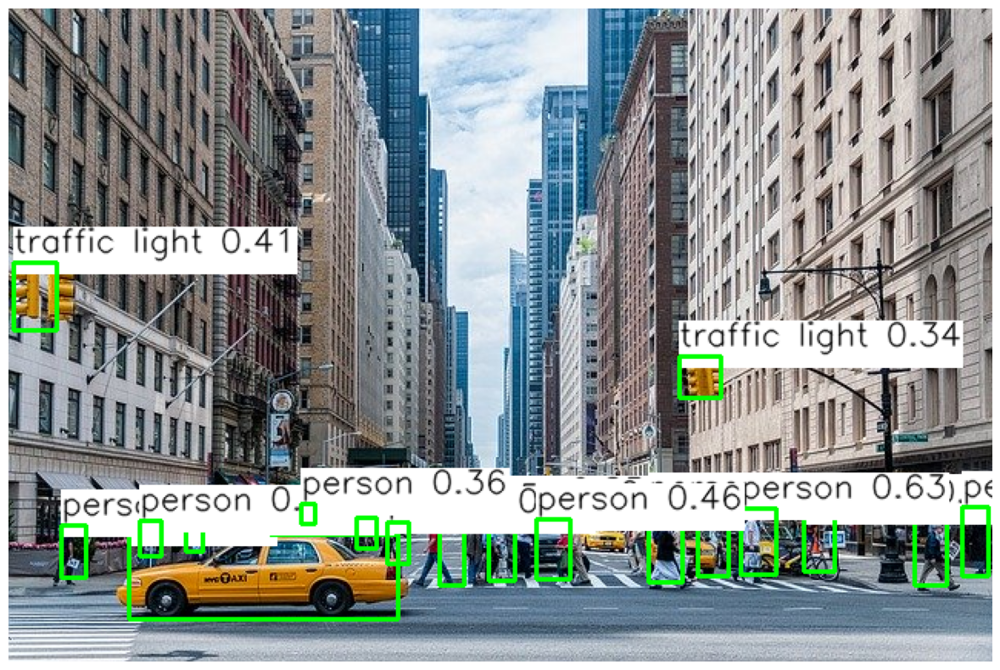

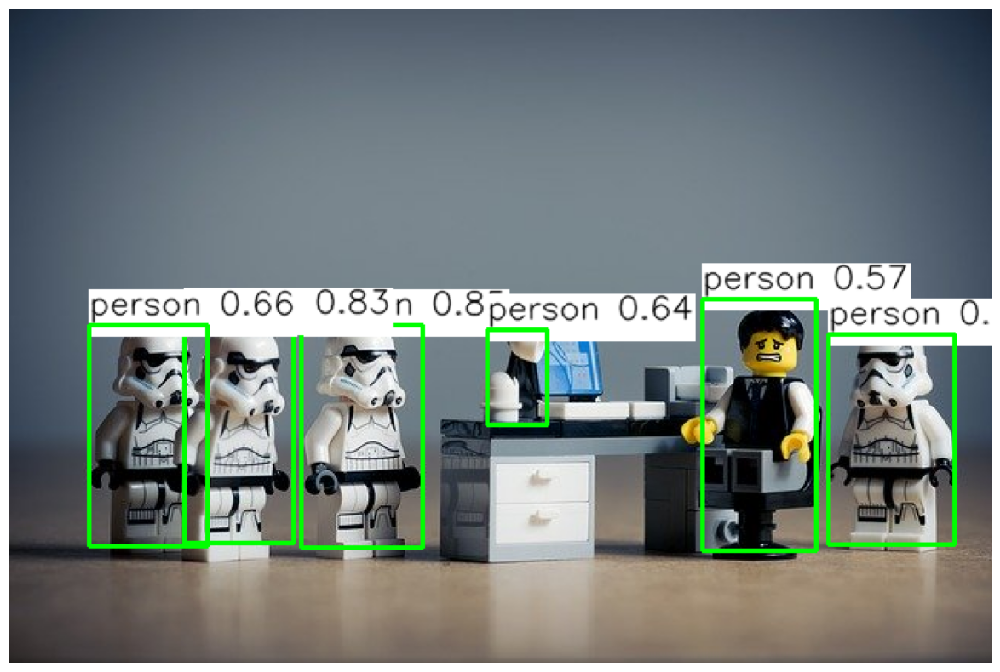

In [ ]:
for i in range(1, 10):

    im = cv.imread(f"image_data/{i}.jpg")
    objects = detect_objects(net1, im)
    display_objects(im, objects)

for i in range(1, 10):

    im = cv.imread(f"image_data/{i}.jpg")
    objects = detect_objects(net2, im)
    display_objects(im, objects)